# SIPRAD Reconstruction Demo

In this notebook we demonstrate using machine learning (ML) to reconstruct the magnetic phase shift from a single defocused LTEM image. This is enabled by using a deep image prior (DIP), a type of generative neural network (NN), and automatic differentiation (AD) to backpropagate the loss and update the model. We call this method SIPRAD: Single Image Phase Reconstruction via Automatic Differentiation. See our [paper](https://doi.org/10.1038/s41524-024-01285-8) for more details. 

While this notebook requires [pyTorch](https://pytorch.org/get-started/locally/) to run, it does not require a large or powerful GPU. SIPRAD can be run (for small ROIs) on a cpu if necessary, though it will take minutes to reconstruct rather than seconds. 

Authors: Arthur McCray  
amccray@stanford.edu  
v1.0, LBL/ANL, July 2024

## Overview
This notebook demonstrates 2 examples of reconstructing simulated data, first without and second with non-magnetic contaminates added to the sample that contribute an electrostatic phase shift. We then use SIPRAD to reconstruct the experimental image of CGT that was used for a SITIE reconstruction in demo 01. 

## Imports

In [2]:
from pathlib import Path
import numpy as np
import scipy.ndimage as ndi
import torch
from skimage.draw import random_shapes

from PyLorentz.phase import DIP_NN, SITIE, ADPhase
from PyLorentz.sim import SimLTEM
from PyLorentz.utils import ImageNoiser, Microscope
from PyLorentz.visualize import show_2D, show_im

dev_count = torch.cuda.device_count()
print(f"There are {dev_count} GPU(s) available")
if dev_count == 0:
    print(f"No GPUs found--proceeding with cpu. This might be slow.")
    device = torch.device(f'cpu')
else:
    device_ind = 0
    print(f"Proceeding with GPU {device_ind}: {torch.cuda.get_device_name(device_ind)}")
    device = torch.device(f'cuda:{device_ind}')

There are 1 GPU(s) available
Proceeding with GPU 0: NVIDIA RTX 2000 Ada Generation Laptop GPU


# Loading and simulating example data
We use a micromagnetics simulation (simulated with MuMax3) of CGT to simulate a LTEM image. 

Text file found: d:\code\PyLorentz\Examples\data\CGT_sim_B0G.ovf
Simulation size (z, y, x) : (10, 512, 512)
Image (x-y) scale : 4 nm/pixel.
Out-of-plane (z) scale : 10 nm/pixel.


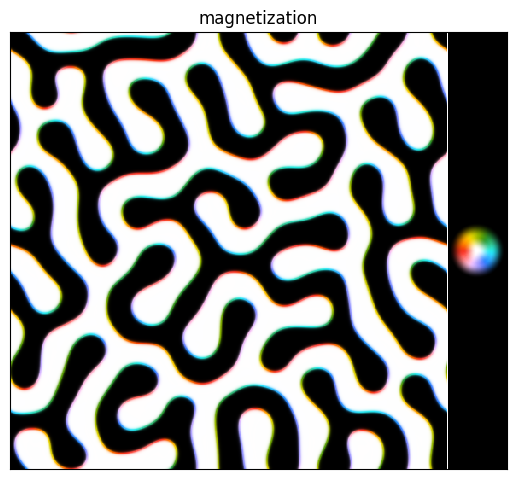

In [3]:
mag_f = Path("./data/CGT_sim_B0G.ovf")
simulator = SimLTEM.load_ovf(mag_f)
simulator.show_mags()

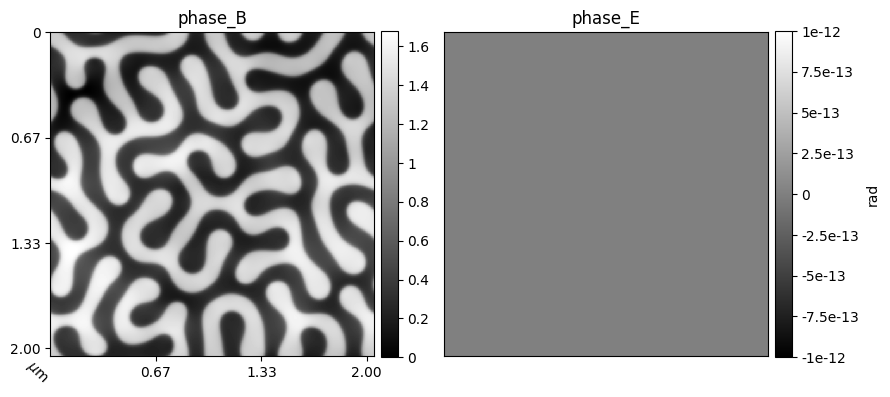

Simulating images for defocus values: -1 mm


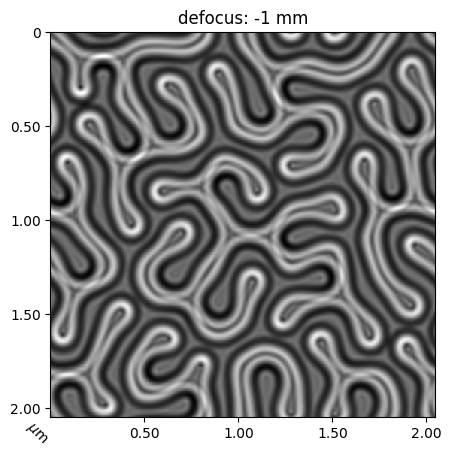

In [4]:
scope = Microscope(
    E=200e3,
    Cs=200e3,
    theta_c=0.01e-3,
    def_spr=80,
)

sample_params = {"B0" : 2.5e3}
simulator.set_sample_params(sample_params)
simulator.compute_phase(method="mans", beam_energy=scope.E)
simulator.show_phase()

defvals = [-1_000_000] # -1mm
dd = simulator.sim_images(defocus_values=defvals, scope=scope)

dd.show_im()

## Basic demonstration with noisy data and no contaminates

We add noise to make the example data slightly more realistic, and put this in a new DefocusedDataset. 

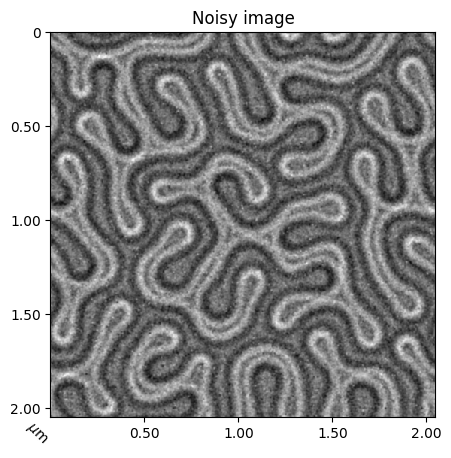

In [5]:
noiser = ImageNoiser(
    poisson = 1e7, # 1e7, total counts/intensity
    gauss = 50, # percent noise, 0+
    salt_and_pepper = 5, # 0+, ~5
    blur = 1, # sigma, 0+, ~0.5
    seed = 42,
)

noisy_im = noiser.run(dd.images)

noisy_dd = dd.copy()
noisy_dd.images = noisy_im
noisy_dd.show_im(title="Noisy image")


Here we intialize the ADPhase object. We initialize it with the DD and Microscope like in previous demos for TIE reconstruction, and also at this point specify a few additional parameters: 
* device : `'cpu'`, `'gpu'`, or `torch.Device` that will be used.
* LRs : the learning rates and weights that we will use. Interestingly, we have found that using a small amount of TV loss can increase the accuracy of the reconstructions in many cases even while using a DIP. 
* noise_frac : the amount of noise to add to the DIP input every iteration. This helps prevent the DIP from falling into local minima, though it can also make the reconstruction less stable if set too high. 
* gaussian_sigma : at the end of the reconstruction, the final output will be smoothed with a gaussian filter to remove high-frequency artifacts that are generated by the DIP. 

In [6]:
LRs = {
    "phase": 2e-4, # LR for the phase DIP. Default 2e-4
    "amp_scale": 0.01, # LR for solving amplitude scale. Default 0.1
    "TV_phase_weight": 5e-3, # TV loss weight for the phase. Default 5e-3
}

siprad = ADPhase(
    dd=noisy_dd,
    device=device,
    scope=scope,
    LRs=LRs,
    noise_frac=1/100,
    gaussian_sigma=1,
)

DIP_phase = DIP_NN() # initialize the NN we use as a DIP

The reconstruction itself has two steps: 1) optionally pre-training the DIP on the input, and 2) applying the DIP to reconstruct the input data. Pre-training the DIP is done when using the "SITIE" mode for the input guess phase. This will use a SITIE reconstruction as the input for the DIP, and the DIP will be initially trained to output the SITIE phase. This drastically increases the stability of the reconstruction and reduces the number of iterations required. 

SITIE guess phase:


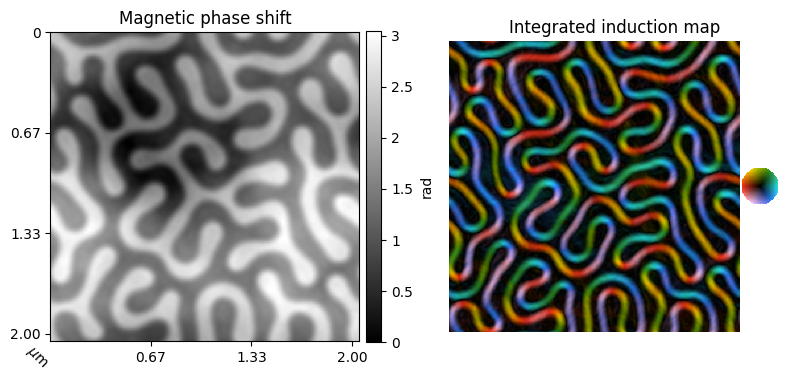

Pre-training


100%|██████████| 200/200 [00:04<00:00, 46.64it/s]


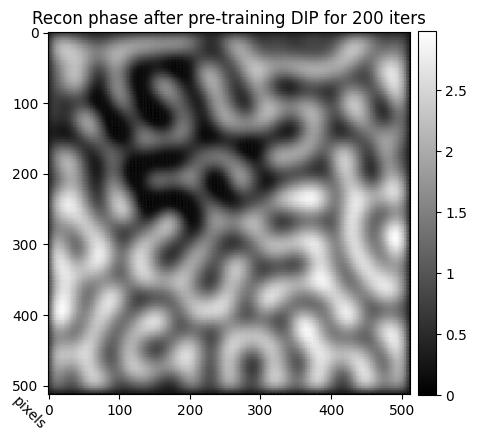

Reconstructing


100%|██████████| 300/300 [00:05<00:00, 57.23it/s]


total time (h:m:s) = 0:00:10


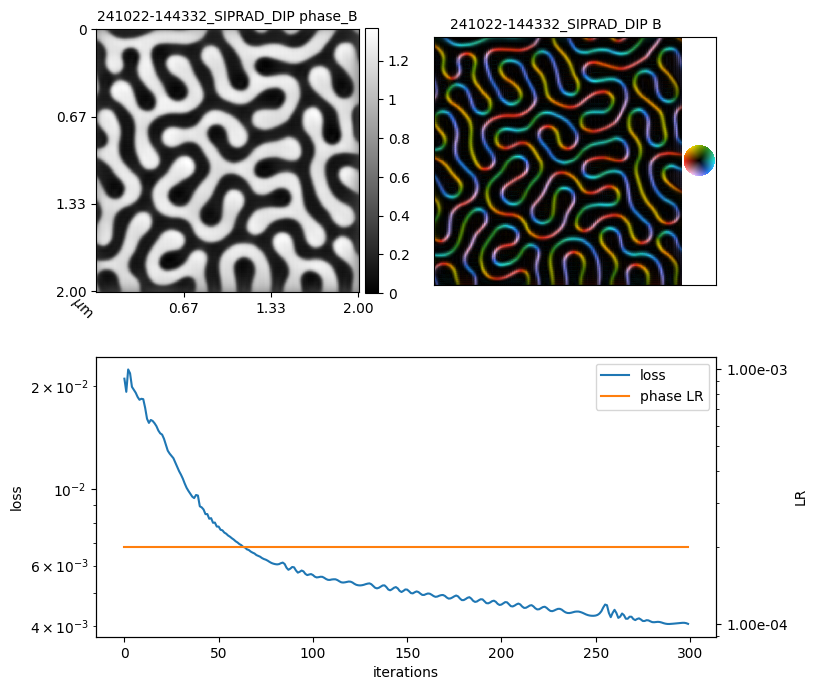

SIPRAD   phase: acc 96.4% SSIM 0.851 | Bave: acc 95.9% SSIM 0.896
SITIE    phase: acc 73.0% SSIM 0.627 | Bave: acc 87.0% SSIM 0.640


In [7]:
siprad.reconstruct(
    num_iter=300,
    model=DIP_phase,
    num_pretrain_iter=200,
    solve_amp_scale=True,  # optimize the amplitude scale
    guess_amp=None,  # Will make a guess of the amplitude assuming a uniform amplitude from the input image
    reset=True,  # will reset model weights and restart the reconstruction
    verbose=2,  # verbose = 2 to show plots
    guess_phase="SITIE",
)

siprad.visualize()

siprad_metrics = siprad.calc_phase_metrics(simulator.phase_B, siprad.best_phase)
sitie_metrics = siprad.calc_phase_metrics(simulator.phase_B, siprad.guess_phase)
print(f"{'SIPRAD':8} phase: acc {siprad_metrics['acc_phase']*100:.1f}% SSIM {siprad_metrics['SSIM_phase']:.3f} | Bave: acc {siprad_metrics['acc_Bave']*100:.1f}% SSIM {siprad_metrics['SSIM_Bave']:.3f}")
print(f"{'SITIE':8} phase: acc {sitie_metrics['acc_phase']*100:.1f}% SSIM {sitie_metrics['SSIM_phase']:.3f} | Bave: acc {sitie_metrics['acc_Bave']*100:.1f}% SSIM {sitie_metrics['SSIM_Bave']:.3f}")

SIPRAD does an excellent job of reconstructing the true phase shift, but this was a very simple example. 

## Reconstructing a simulated image with amplitude and phase_E variation from contaminates

In order to more accurately simulate experimental conditions, we will now simulate an image with added sample contaminates, such as can occur frequently when performing cryo experiments. These contaminates modify the amplitude of the object wave and also add an additional non-uniform electrostatic phase shift. As we saw in demo 01, we normally require 2 TFS (flip and unflip) in order to isolate the magnetic phase shift from a sample with non-uniform $\phi_E$. However, assuming that our sample _should_ be flat and that all variations in $\phi_E$ come from non-magnetic contaminates, we can say that the object amplitude $\propto$ $\phi_E$. Then by selecting an appropriate amplitude map and learning the scaling factors of both the amplitude and $\phi_E$, we can effectively isolate $\phi_B$. 

First we create a couple of contaminates and use them to simulate a new LTEM image. 

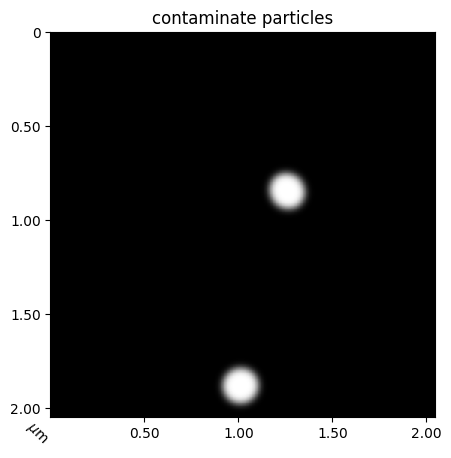

In [8]:
num_dirt = 2
rand_shape = random_shapes(noisy_im[0].shape, max_shapes=num_dirt, min_shapes=num_dirt,
                                             shape="ellipse", min_size=30, max_size=50, channel_axis=None, rng=42)[0]
dirt = np.where(rand_shape<255, 1, 0).astype('float')
dirt = ndi.gaussian_filter(dirt, 5)

show_im(dirt, scale=simulator.scale, cbar=False, title="contaminate particles")

To simulate the image we use sample_params for the contaminates (because the sample is uniform this is okay), and modify the sample shape function with the contaminates. 

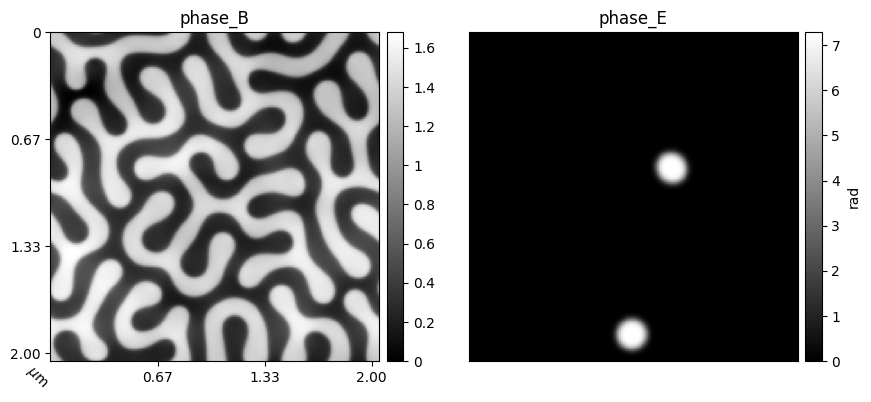

Simulating images for defocus values: -1 mm


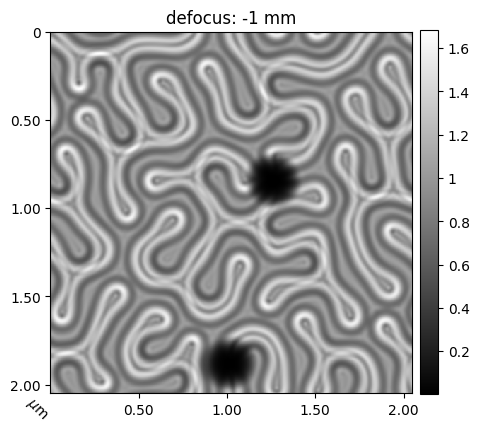

In [9]:
dirt_sim = simulator.copy()
shape_func = np.zeros(dirt_sim.shape).astype('float')
shape_func[5:] += dirt # 50 nm thick, zscale=10, shape is (10, 512, 512)
dirt_sim.shape_func = shape_func

sample_params = {"B0" : 2.5e3, "sample_V0": 20, "sample_xip0": 10}

dirt_sim.set_sample_params(sample_params)
dirt_sim.compute_phase(method="mans", beam_energy=scope.E)
dirt_sim.show_phase()

defvals = [-1_000_000] # -1mm
dirty_dd = dirt_sim.sim_images(defocus_values=defvals, scope=scope)

dirty_dd.show_im(cbar=True)

We also add noise like normal

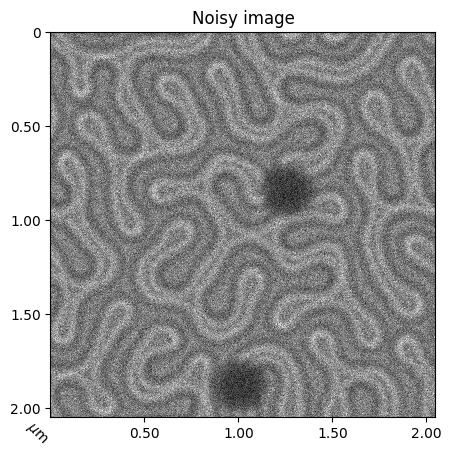

In [10]:
noiser = ImageNoiser(
    poisson = 1e7, # 1e7, total counts/intensity
    gauss = 50, # percent noise, 0+
    seed = 42,
)

noisy_dirt = noiser.run(dirty_dd.images)

dirty_dd.images = noisy_dirt
dirty_dd.show_im(title="Noisy image")


We now need to create our amplitude function from this image. The amplitude function should show the sample contaminates without any magnetic features. One way to create this is by thresholding the image using a manually selected value.  

We set the high value of the amplitude to the square root of the mean input image intensity, and the low value of the amplitude to the square root of the minimum input image intensity. We additionally smooth the amplitude as hard edges can create Fourier artifacts in the forward model. 

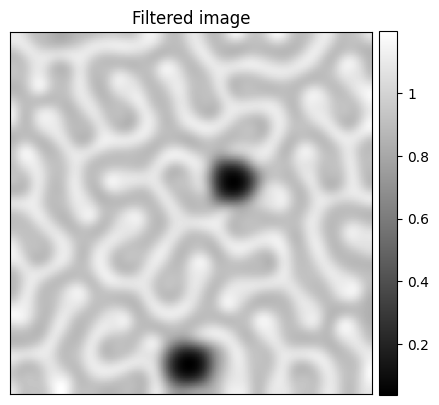

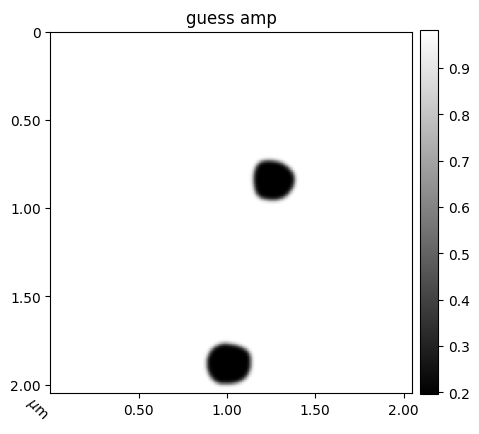

In [11]:
filt_im = ndi.gaussian_filter(dirty_dd.image, 10)
show_im(filt_im, title="Filtered image", ticks_off=True)
thresh = 0.5
guess_amp = np.where(filt_im>thresh, np.sqrt(np.mean(filt_im)), np.sqrt(np.min(filt_im)))
guess_amp = ndi.gaussian_filter(guess_amp.astype('float'), 3)
show_im(guess_amp, title="guess amp", scale=dirty_dd.scale)

We also want to optimize the guess phase that the DIP will initially be trained to output. We will get this from a SITIE reconstruction. It also highlights why SITIE can be limiting and why the SIPRAD method is worth it. 

Performing SITIE reconstruction with defocus -1 mm, index = 0
Using a Tikhonov frequency [1/nm]: 1.0e-03


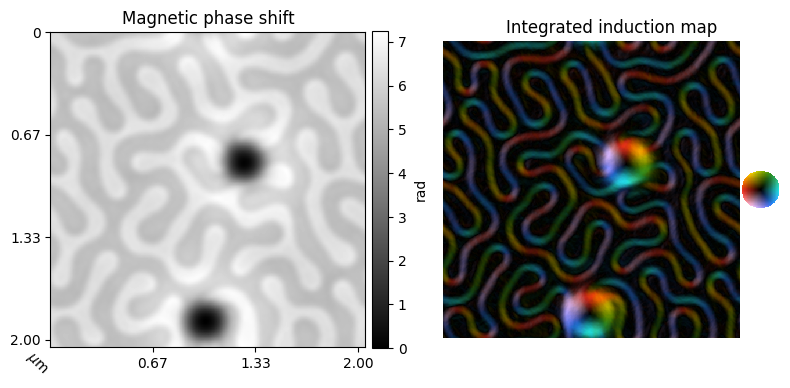

In [12]:
sitie = SITIE(dirty_dd)
qc = 0.001
sitie.reconstruct(qc=qc).visualize(cbar=True);

Like before, we initialize our ADPhase object. We additionally specify theLR for amp2phi_scale, which is the scaling factor that converts the amplitude to $\phi_E$. Sample params are used to initialize the amp2phi scaling factor, and these can be approximated as it will be optimized during reconstruction. 

In [13]:
LRs = {
    "phase": 2e-4,
    "amp": 2e-4,
    "amp_scale": 0.1,
    "amp2phi_scale": 1,
    "TV_phase_weight": 0.1,
}

# here we set scaling factors to a factor of 2 greater than the "true" values used
# to simulate the images in order to demonstrate that they will be optimized
sample_params = {
    "dirt_V0" : 40,
    "dirt_xip0" : 20,
}

siprad_dirt = ADPhase(
    dd=dirty_dd,
    device=device,
    scope=scope,
    sample_params=sample_params,
    LRs=LRs,
    scheduler_type=None,
    noise_frac=1/100,
    gaussian_sigma=1,
)

DIP_phase = DIP_NN()


We add a couple of items here to the reconstruction. First, we will use a LR scheduler to vary the LRs with time. Here we use an exponential scheduler, but other options include "cyclic" and "plateau". Scheduler parameters can be passed with kwargs. 

Reconstructing the phase shift for samples with contaminates is less stable than for samples with a uniform amplitude. Therefore we will initially only reconstruct for 300 iterations, in order to check if the model is converging towards the correct result. If so, we will continue the training for additional iterations. 

Lastly, if you have good guesses of the amplitude and scaling factors, solve_amp_scale can be set to False to fix these values. 

Pre-training


100%|██████████| 300/300 [00:04<00:00, 70.84it/s]


Reconstructing


100%|██████████| 300/300 [00:04<00:00, 60.32it/s]


total time (h:m:s) = 0:00:09


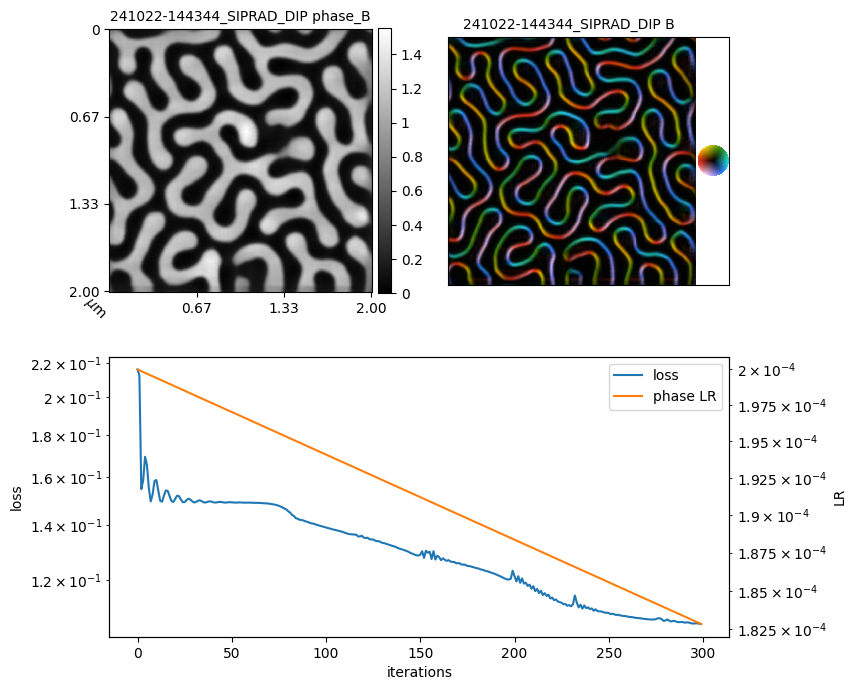

SIPRAD   phase: acc 94.2% SSIM 0.732 | Bave: acc 92.2% SSIM 0.873
SITIE    phase: acc 45.9% SSIM 0.214 | Bave: acc 68.9% SSIM 0.713


In [14]:
siprad_dirt.reconstruct(
    num_iter=300,
    model = DIP_phase,
    num_pretrain_iter=300,
    solve_amp_scale = True,
    guess_amp=guess_amp,
    reset=True,
    verbose = 1, # verbose = 2 to show additional plots
    scheduler_type="exp",
    qc=0.001,
)

siprad_dirt.visualize()

siprad_metrics = siprad_dirt.calc_phase_metrics(simulator.phase_B, siprad_dirt.best_phase)
sitie_metrics = siprad_dirt.calc_phase_metrics(simulator.phase_B, siprad_dirt.guess_phase)
print(f"{'SIPRAD':8} phase: acc {siprad_metrics['acc_phase']*100:.1f}% SSIM {siprad_metrics['SSIM_phase']:.3f} | Bave: acc {siprad_metrics['acc_Bave']*100:.1f}% SSIM {siprad_metrics['SSIM_Bave']:.3f}")
print(f"{'SITIE':8} phase: acc {sitie_metrics['acc_phase']*100:.1f}% SSIM {sitie_metrics['SSIM_phase']:.3f} | Bave: acc {sitie_metrics['acc_Bave']*100:.1f}% SSIM {sitie_metrics['SSIM_Bave']:.3f}")

Reconstructing


100%|██████████| 500/500 [00:07<00:00, 62.70it/s]


total time (h:m:s) = 0:00:07


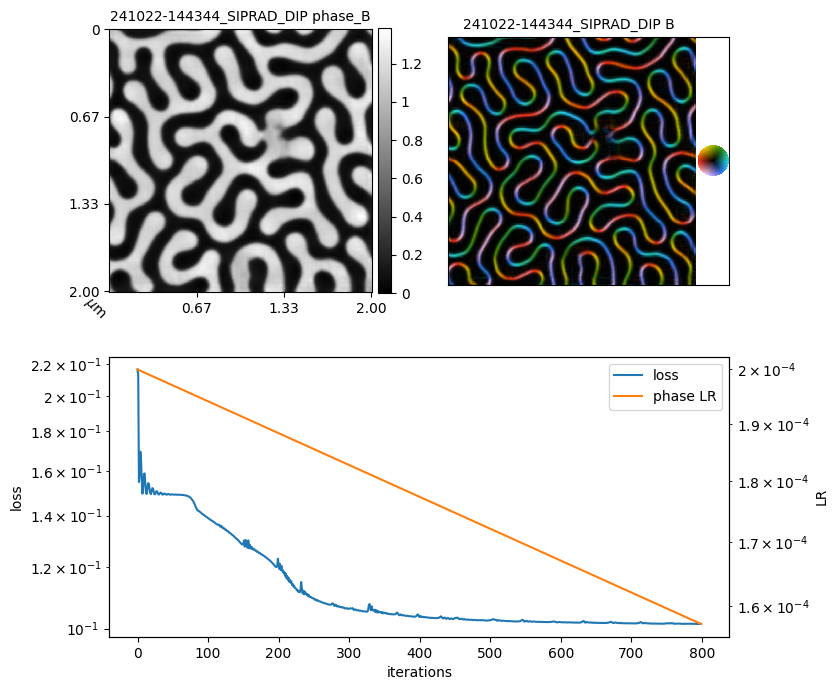

SIPRAD   phase: acc 96.8% SSIM 0.792 | Bave: acc 96.5% SSIM 0.912
SITIE    phase: acc 45.9% SSIM 0.214 | Bave: acc 68.9% SSIM 0.713


In [15]:
siprad_dirt.reconstruct(
    num_iter=500,
    model = DIP_phase,
    reset=False, # will reset model weights
    scheduler_type="continue", # don't reset the scheduler or LRs
)

siprad_dirt.visualize()

siprad_metrics = siprad_dirt.calc_phase_metrics(simulator.phase_B, siprad_dirt.best_phase)
sitie_metrics = siprad_dirt.calc_phase_metrics(simulator.phase_B, siprad_dirt.guess_phase)
print(f"{'SIPRAD':8} phase: acc {siprad_metrics['acc_phase']*100:.1f}% SSIM {siprad_metrics['SSIM_phase']:.3f} | Bave: acc {siprad_metrics['acc_Bave']*100:.1f}% SSIM {siprad_metrics['SSIM_Bave']:.3f}")
print(f"{'SITIE':8} phase: acc {sitie_metrics['acc_phase']*100:.1f}% SSIM {sitie_metrics['SSIM_phase']:.3f} | Bave: acc {sitie_metrics['acc_Bave']*100:.1f}% SSIM {sitie_metrics['SSIM_Bave']:.3f}")

We see that there is noise and inaccuracies around the contaminates (which is to be expected, as we have no magnetic signal there!) but that away from the contaminates the reconstruction is still qualitatively and quantitatively accurate, and much better than the SITIE reconstruction. 

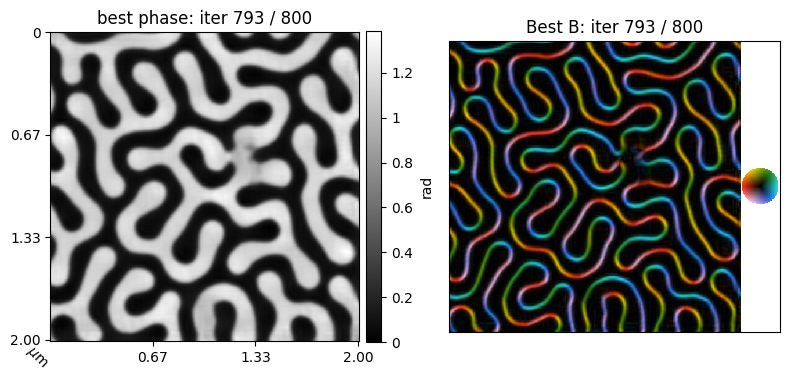

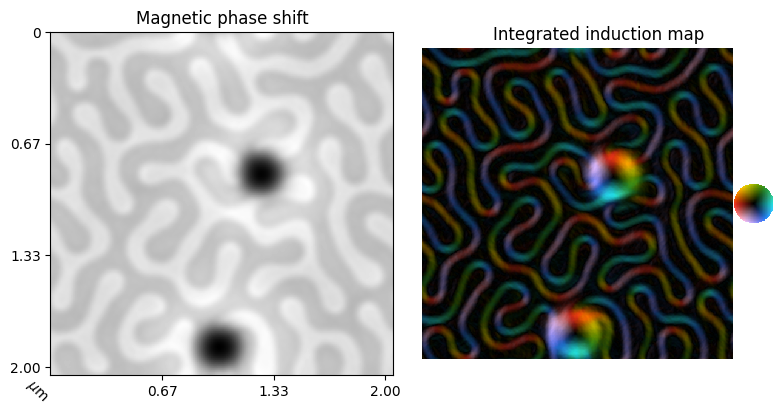

In [16]:
siprad_dirt.show_best()
sitie.visualize();

# Application to experimental data
The important thing, of course, is to apply SIPRAD to experimental data. Here we use the same image of Bloch bubbles in CGT as was used in demo 01 for the SITIE reconstruction. 

Because we can account for the sample contaminates, we can select a much larger ROI than we did previously. 

In [17]:
import matplotlib.pyplot as plt
from PyLorentz.dataset import DefocusedDataset
from PyLorentz.io import read_image

Filtering hot/dead pixels


100%|██████████| 1/1 [00:00<00:00,  3.62it/s]


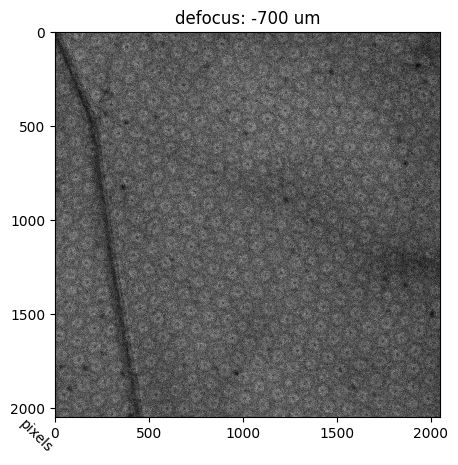

Rotation:  -10 | Points: ( 200,  380), (1736, 1916) | Dimensions (h x w): 1536 x 1536


100%|██████████| 1/1 [00:00<00:00,  3.08it/s]


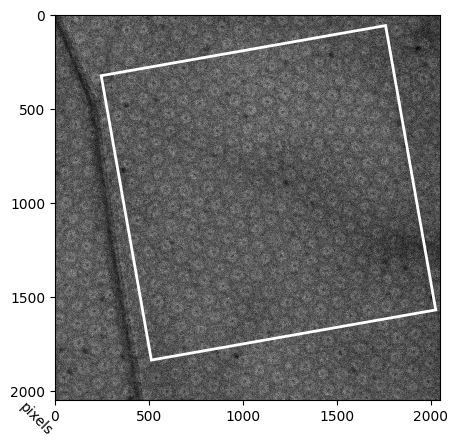

In [18]:
file_CGT = Path("./data/CGT_Tx0_Ty0_B500_df-0.7mm_T30K.dm4")
image, mdata = read_image(file_CGT)
mdata["defocus_values"] = -0.7 # from filename, not in file metadata
mdata["defocus_unit"] = "mm"

dd_exp = DefocusedDataset.load(
    images=image,
    metadata=mdata,

)
dd_exp.preprocess()
dd_exp.show_im()

dimy = dimx = 1536
top = 200
left = 380
dd_exp.transforms = {'rotation': -10, 'top': top, 'bottom': top+dimy, 'left': left, 'right': left+dimx}
dd_exp.apply_transforms()
show_im(dd_exp._orig_images_preprocessed[0], roi=dd_exp.transforms, scale=dd_exp.scale, cbar=False)

The current version of SIPRAD does not account for diffraction contrast from bend contours or variation in illumination. I.e. it does not handle low-frequency noise very well, and this will end up in the phase shift. We therefore filter the image here to remove those artifacts. (Handling bend contours would be a great feature to add, if you're interested in implementing this or collaborating because you have a dataset that requires it, please reach out!)

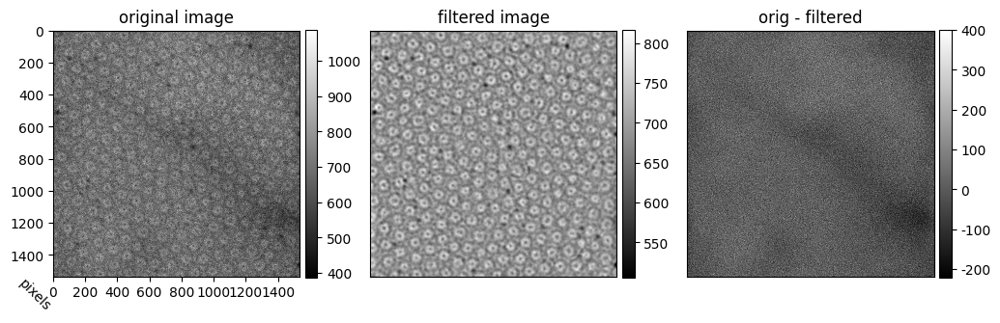

In [19]:
q_lowpass = 1 / 300  # 1/nm
q_highpass = 1 / 40  # 1/nm
dd_exp.filter(
    q_lowpass=q_lowpass, q_highpass=q_highpass, filter_type="butterworth", show=True
)


Next we create the amplitude map from our image and find an appropriate qc value for the SITIE reconstruction. 

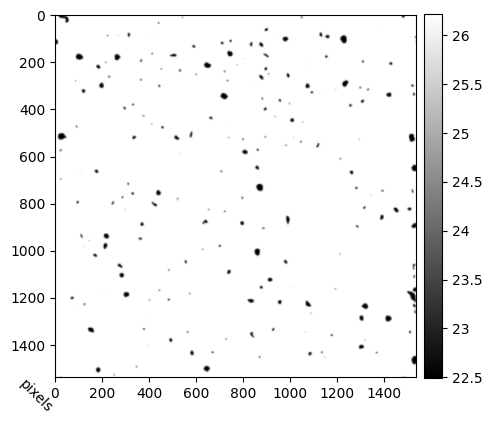

In [20]:
meanval = np.sqrt(np.mean(dd_exp.image))
minval = np.sqrt(np.min(dd_exp.image))
guess_amp = np.where(dd_exp.image>630, meanval, minval)
guess_amp = ndi.gaussian_filter(guess_amp.astype('float'), 3)
show_im(guess_amp)

Performing SITIE reconstruction with defocus -700 um, index = 0
Using a Tikhonov frequency [1/nm]: 1.0e-03


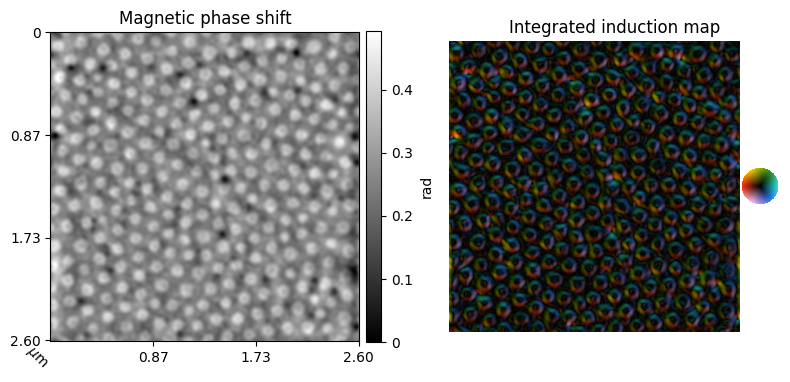

In [21]:
sitie = SITIE(dd_exp)
qc = 0.001
sitie.reconstruct(qc=qc).visualize(cbar=True);

In [22]:
scope = Microscope(
    E=200e3,
    theta_c=0.01e-3,
    def_spr=80,
)

LRs = {
    "phase": 2e-4,
    "amp_scale": 0.1,
    "amp2phi_scale": 1,
    "TV_phase_weight": 10,
}

sample_params = {
    "dirt_V0" : 10,
    "dirt_xip0" : 5,
}

siprad_exp = ADPhase(
    dd=dd_exp,
    device=device,
    scope=scope,
    sample_params=sample_params,
    LRs=LRs,
    scheduler_type=None,
    noise_frac=1/100,
    gaussian_sigma=3,
)

DIP_phase = DIP_NN()


We set `store_iters_every = 50` so that we can both monitor our reconstruction (with verbose=2) and select our best reconstruction later. 

SITIE guess phase:


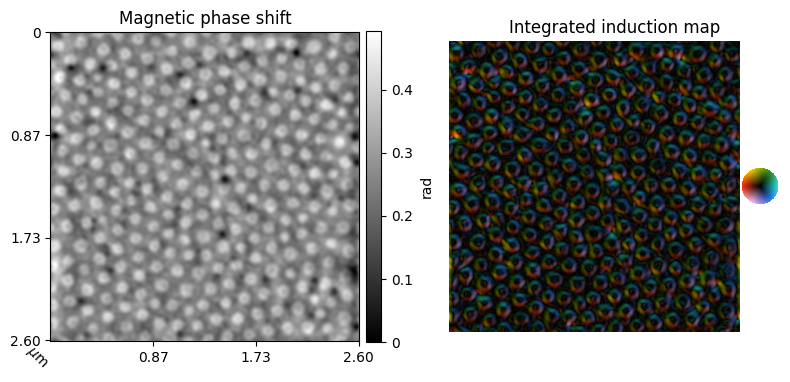

Pre-training


100%|██████████| 500/500 [01:03<00:00,  7.88it/s]


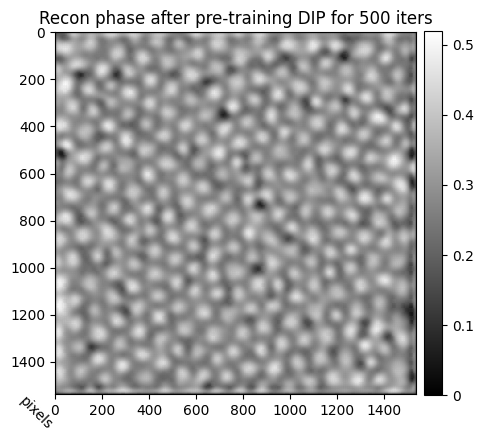

Reconstructing


 16%|█▋        | 49/300 [00:07<00:34,  7.27it/s]

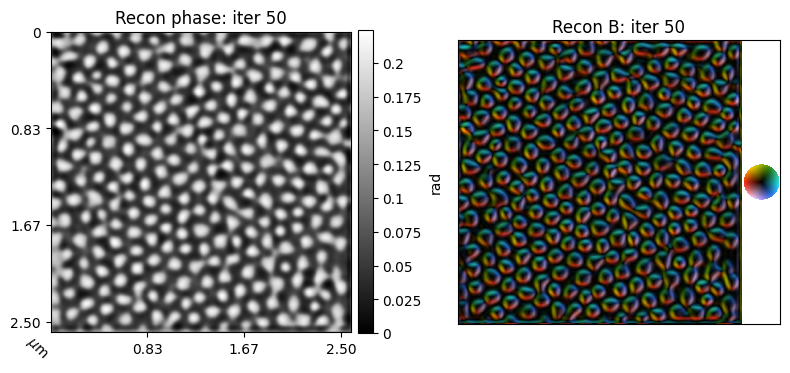

 33%|███▎      | 99/300 [00:14<00:27,  7.28it/s]

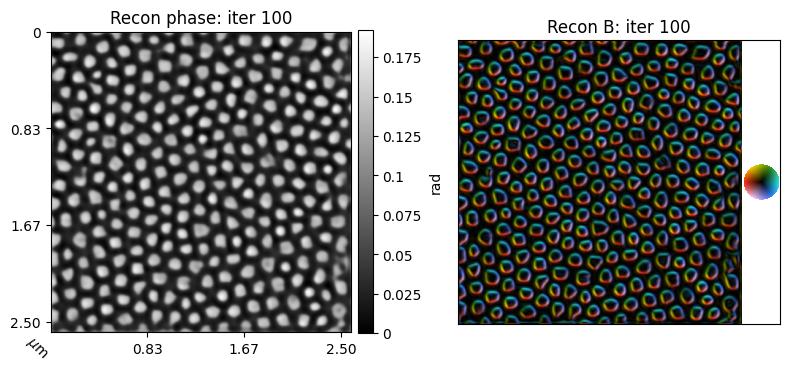

 50%|████▉     | 149/300 [00:25<00:31,  4.85it/s]

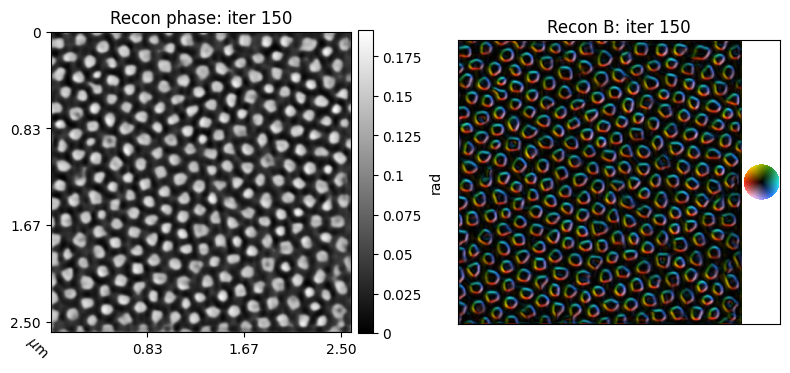

 66%|██████▋   | 199/300 [00:35<00:20,  4.99it/s]

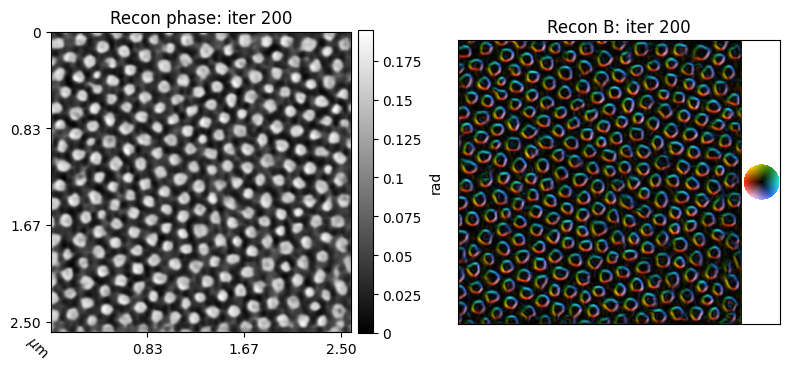

 83%|████████▎ | 249/300 [00:44<00:09,  5.25it/s]

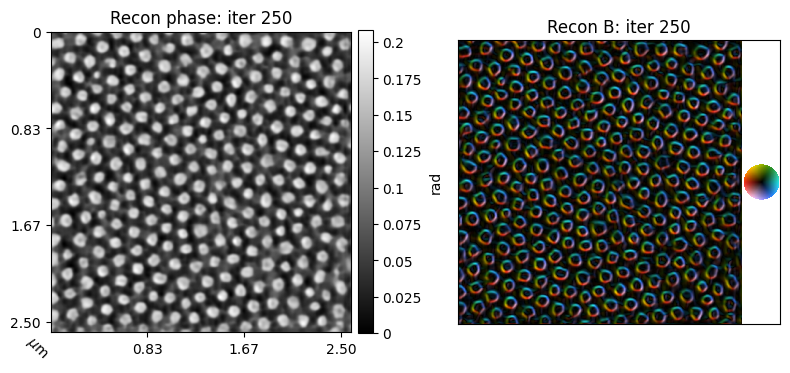

100%|█████████▉| 299/300 [00:53<00:00,  6.15it/s]

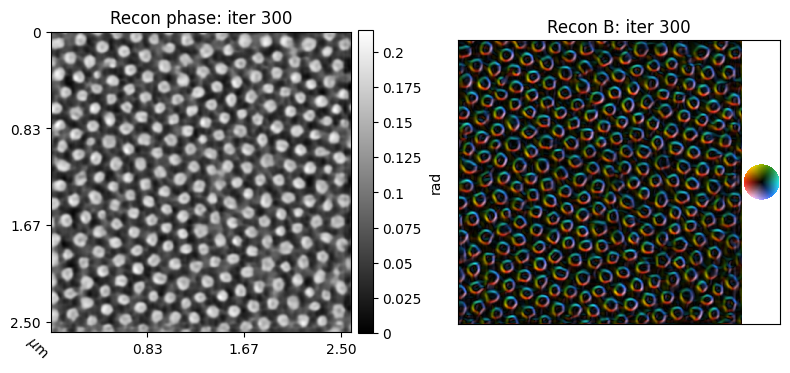

100%|██████████| 300/300 [00:54<00:00,  5.49it/s]


total time (h:m:s) = 0:02:00


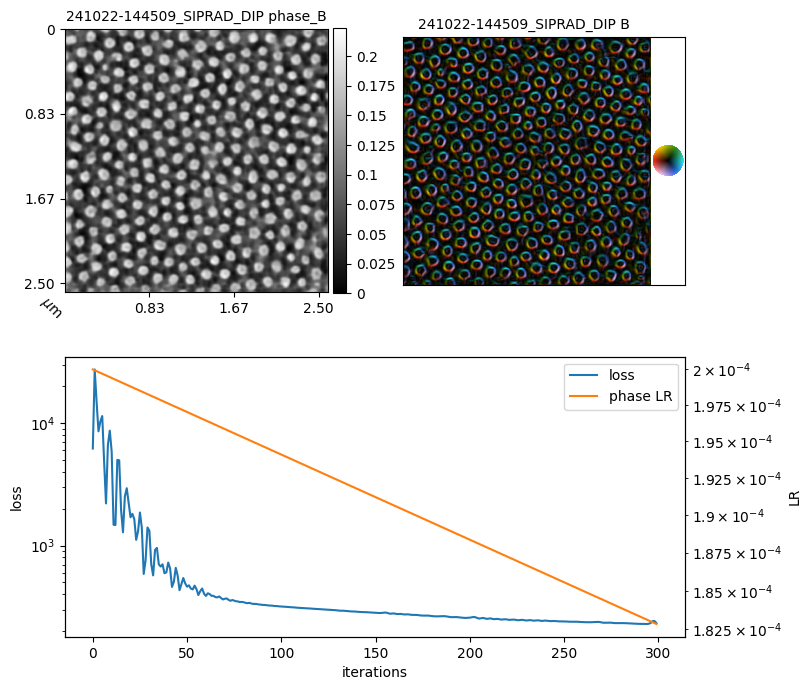

In [23]:
siprad_exp.reconstruct(
    num_iter=300,
    model = DIP_phase,
    num_pretrain_iter=500,
    solve_amp_scale = True,
    guess_amp=guess_amp,
    reset=True, # will reset model weights
    store_iters_every=50,
    verbose = 2, # verbose = 2 to show plots
    scheduler_type="exp",
    qc=0.001,
)

siprad_exp.visualize()

We can see that while the loss is decreasing with more iteratoins, the model is over-fitting towards noise. This could potentially be improved by changing the model architecture, but we can also simply select our reconstructed phase from before the overfitting occurs. We saved the reconstructed phase at 50 iteration intervals, and here we can look again at those snapshots and pick our preferred reconstruction. 

We see that there is some artifacting around the edges of the reconstructed phase due to PBCs currently enforced in the forward model. This can lead to strong artifacts around the edges of the integrated induction, which skews the color scaling of the vector map image. We therefore crop the edges of the integrated induction maps before saving the vector image. 

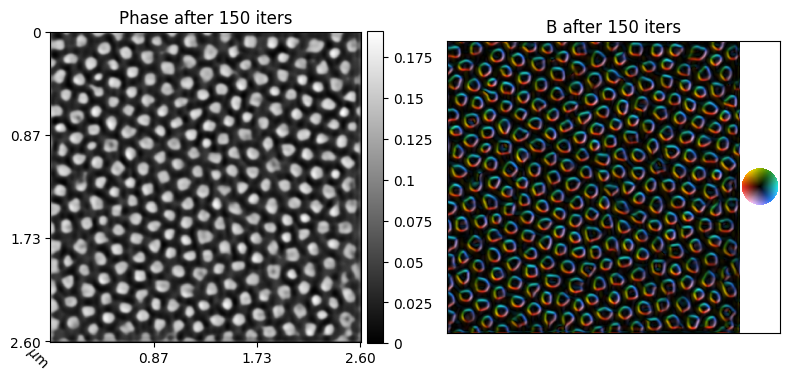

In [24]:
iter_ind = 3
siprad_exp.gaussian_sigma = 3
crop = 5

ph, iter = siprad_exp.phase_iterations[iter_ind]
By, Bx = siprad_exp.induction_from_phase(ph)
By = By[crop:-crop, crop:-crop]
Bx = Bx[crop:-crop, crop:-crop]

fig, axs = plt.subplots(ncols=2, figsize=(8,4))
show_im(ph, title=f"Phase after {iter} iters", figax=(fig, axs[0]), scale=siprad_exp.scale, cbar=True)
show_2D(Bx, By, title=f"B after {iter} iters", figax=(fig, axs[1]))
plt.tight_layout()
plt.show()

We can set the ``siprad_exp.best_phase`` to be the chosen value: 

In [25]:
siprad_exp.set_best_phase(iter_ind)

And we can save all of the results. This will save to ``siprad_exp.save_dir``, but the output directory and name prefix can be set here as well. The phase, Bx, By, and color images are saved, though the full color image (not cropped) will likely not look as good as the cropped version. 

In [26]:
siprad_exp.save_dir

WindowsPath('d:/code/PyLorentz/Examples/data/SIPRAD_outputs')

In [27]:
siprad_exp.save_results()

Saving tif:  d:\code\PyLorentz\Examples\data\SIPRAD_outputs\241022-144509_SIPRAD_DIP_i150_-700um_phase_B.tiff
Saving tif:  d:\code\PyLorentz\Examples\data\SIPRAD_outputs\241022-144509_SIPRAD_DIP_i150_-700um_By.tiff
Saving tif:  d:\code\PyLorentz\Examples\data\SIPRAD_outputs\241022-144509_SIPRAD_DIP_i150_-700um_Bx.tiff
Saving tif:  d:\code\PyLorentz\Examples\data\SIPRAD_outputs\241022-144509_SIPRAD_DIP_i150_-700um_color.tiff
Saving tif:  d:\code\PyLorentz\Examples\data\SIPRAD_outputs\241022-144509_SIPRAD_DIP_i150_-700um_input_image.tiff
Saving json: d:\code\PyLorentz\Examples\data\SIPRAD_outputs\241022-144509_SIPRAD_DIP_i150_-700um_log.json


We therefore also save a cropped version of the induction map here: 

Saving: d:\code\PyLorentz\Examples\data\SIPRAD_outputs\241022-144509_SIPRAD_DIP_i150_-700um_Bmap_c5.png


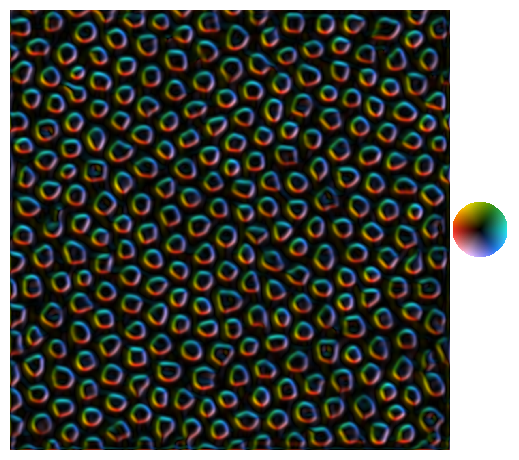

In [28]:
# save color im with crop
crop = 5
name = f"{siprad_exp._save_name}_{siprad_exp._fmt_defocus(siprad_exp.defvals[0])}_Bmap_c{crop}.png"
fname = siprad_exp.save_dir / name

show_2D(
    siprad_exp.Bx[crop:-crop,crop:-crop],
    siprad_exp.By[crop:-crop,crop:-crop],
    save = fname,
)
